# RE Forecasting: Data extraction and Preprocessing

In [25]:
import pandas as pd
import numpy as np
from datetime import datetime as dt, timedelta
import os

from MaStR import get_MaStR
from entso_e import get_generation_data, aggregate_generation_data, get_price, plot_generation
from DataAggregation import clean_consumption, compute_emissions, cluster_facilities, plot_facilities, aggregate_data
from Weather import get_weather_data

In [32]:
# Time period of historical data used for predictions: 5 years
timezone = "Europe/Brussels"
start_date = "2018-08-01"
end_date = "2023-08-01"

start = pd.Timestamp(f"{start_date}T00:00:00", tz=timezone).floor(freq="h")
end = pd.Timestamp(f"{end_date}T00:00:00", tz=timezone).floor(freq="h")

# Directories
fpath = "data"
save_path = f"{fpath}/{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}"
if not os.path.isdir(save_path):
    os.makedirs(save_path)

## Get historical generation data and price from the entso-e transparency platform

In [33]:
LOAD_FROM_FILE = 0
entsoe_path = f"{save_path}/entsoe"

##### Get generation data

In [34]:
if LOAD_FROM_FILE:
    generation_df = pd.read_parquet(f"{entsoe_path}/generation_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")
else:
    area_code = "10YDE-VE-------2" # 50Hertz control area
    generation_df = get_generation_data(area_code, start, end)
    if not os.path.isdir(entsoe_path):
        os.makedirs(entsoe_path)
    generation_df.to_parquet(f"{entsoe_path}/generation_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

Retrieving electricity generation data from entso-e transparency platform...
Done!


##### Get price

In [35]:
if LOAD_FROM_FILE:
    price_df = pd.read_parquet(f"{entsoe_path}/price_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")
else:    
    price_df = get_price("DE_LU", start, end, generation_df)
    if not os.path.isdir(entsoe_path):
        os.makedirs(entsoe_path)
    price_df.to_parquet(f"{entsoe_path}/price_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

Retrieving electricity price data from entso-e transparency platform...
Done!


## Get consumption data from SMARD.de (Bundesnetzagentur)

In [36]:
LOAD_FROM_FILE = 0
consumption_path = f"{save_path}/consumption"

In [37]:
if LOAD_FROM_FILE:
    consumption_df = pd.read_parquet(f"{consumption_path}/consumption_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")
else:
    consumption_csv = f"{save_path}/smard/Realisierter_Stromverbrauch_{start.strftime('%Y%m%d%H%M')}_{(end-timedelta(minutes=1)).strftime('%Y%m%d%H%M')}_Stunde.csv"
    consumption_df = pd.read_csv(consumption_csv, delimiter=";")
    consumption_df = clean_consumption(consumption_df, generation_df)
    if not os.path.isdir(consumption_path):
        os.makedirs(consumption_path)
    consumption_df.to_parquet(f"{consumption_path}/consumption_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Compute CO2 emissions

In [38]:
emission_df = compute_emissions(generation_df)

## Plot generation data along with consumption, emissions, and price

In [39]:
color_dict = {
    "Fossil Brown coal/Lignite": "#bfb282", 
    "Fossil Gas": "#9e8060", 
    "Fossil Hard coal": "#706962",
    "Hydro Pumped Storage": "#567189", 
    "Solar": "#ffdd00", 
    "Wind Offshore": "#146C94", 
    "Wind Onshore": "#19A7CE",
    "Other renewables": "#32a852", 
    "Other fossils": "#9c9c9c",
}

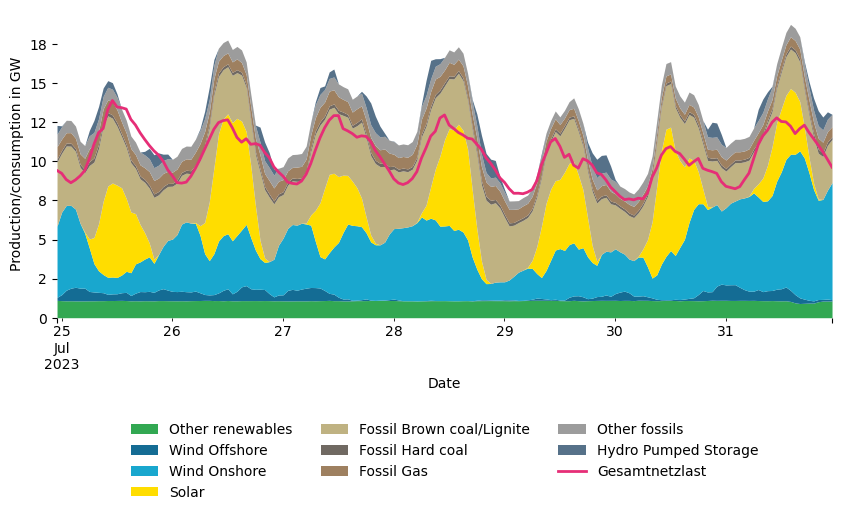

In [40]:
# With consumption
plot_generation(generation_df, color_dict, cons_df=consumption_df, days=7)

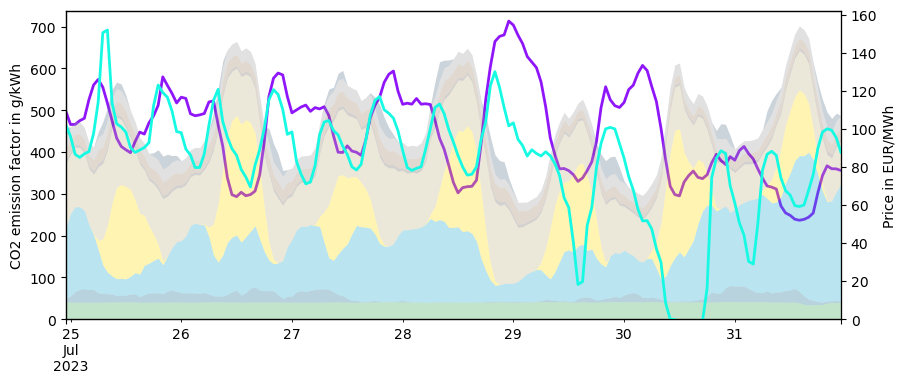

In [41]:
# With emissions and price
# The price is identical across all of Germany and depends on energy availybility in all four TSOs. 
# Therefore, the price does not perfectly reflect fluctuations in the generation and consumption observed 
# in the 50Hertz grid only.
# Also, price is only available from 2018-10-01 onwards.
plot_generation(generation_df, color_dict, em_df=emission_df, pr_df=price_df, days=7)

## Get and process data for different energy types

Steps:
1. Get location and capacity data from Marktstammdatenregister (MaStR)
2. Cluster facilities
3. Plot facilities on map
4. Get weather data for weather dependent production types 
4. Aggregate capacity, weather, and generation data to create final data frames for model fitting 

## Solar

In [42]:
LOAD_FROM_FILE = 1
load_version = "20230704"

##### Get MaStR data

In [43]:
if LOAD_FROM_FILE:
    solar_df = pd.read_parquet(f"{fpath}/MaStR_data/solar_MaStR_{load_version}.parquet")
else:
    solar_df = get_MaStR("solar", fpath)

##### Plot facilities

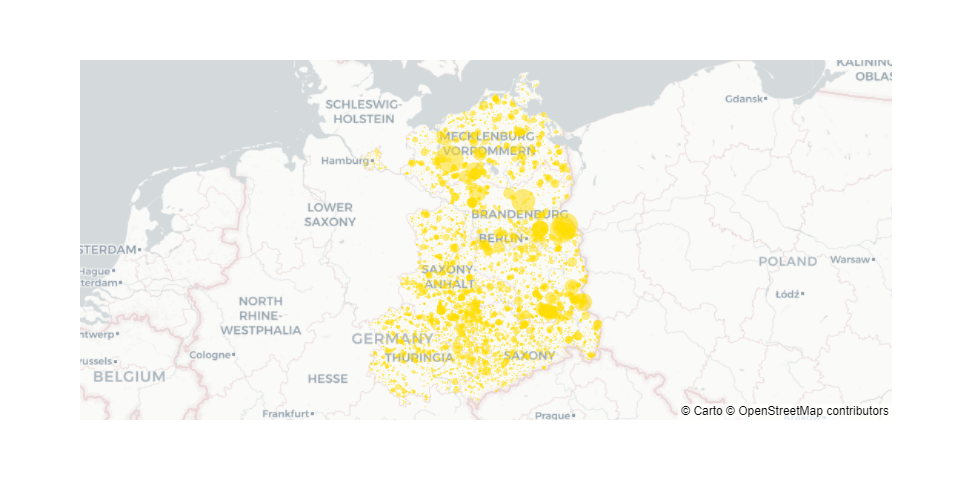

In [44]:
plot_facilities(solar_df, color=color_dict["Solar"])

##### Cluster facilities

In [45]:
# Cluster
k = 100

if LOAD_FROM_FILE:
    solar_df = pd.read_parquet(f"{fpath}/MaStR_data/solar_MaStR_clustered_{k}_{load_version}.parquet")
    solar_cluster_centers = pd.read_parquet(f"{fpath}/MaStR_data/solar_clusters_{k}_{load_version}.parquet")
else:
    solar_df, solar_cluster_centers = cluster_facilities(solar_df, k=k)
    solar_df.to_parquet(f"{fpath}/MaStR_data/solar_MaStR_clustered_{k}_{dt.now().strftime('%Y%m%d')}.parquet")
    solar_cluster_centers.to_parquet(f"{fpath}/MaStR_data/solar_clusters_{k}_{dt.now().strftime('%Y%m%d')}.parquet")

##### Plot clustered facilities

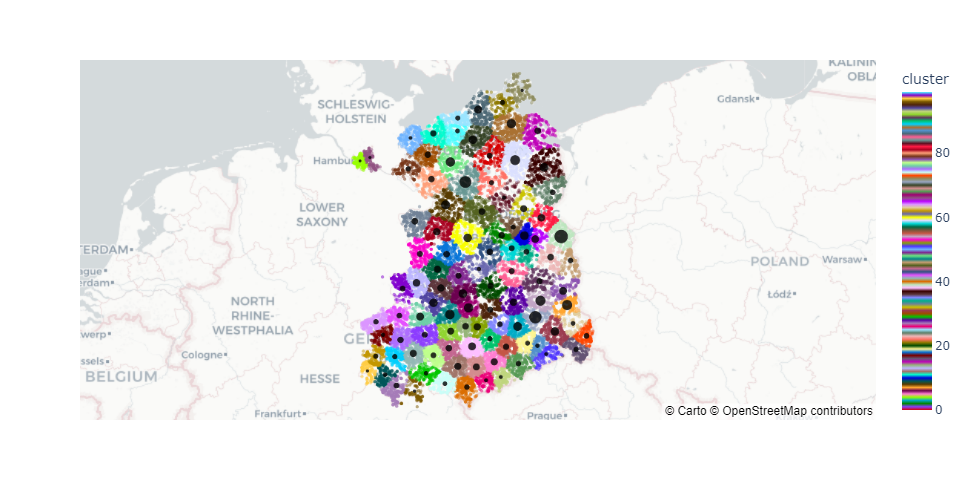

In [46]:
plot_facilities(solar_df, clustered=True, cluster_centers=solar_cluster_centers)

##### Get weather data for cluster centroids

In [48]:
LOAD_FROM_FILE = 0
if LOAD_FROM_FILE:
    solar_weather_df = pd.read_parquet(f"{save_path}/weather/solar/100_clusters/weather_data_weighted_avg.parquet")
else:
    solar_weather_df = get_weather_data(cluster_df=solar_cluster_centers, 
                                        save_path=save_path, 
                                        energy_type="solar", 
                                        start=start.strftime("%Y-%m-%d"),
                                        end=(end-timedelta(days=1)).strftime("%Y-%m-%d"),
                                        timezone=timezone)

Retrieving weather data...
100/100
Done!


##### Aggregate data

In [49]:
# Get aggregate df
aggregate_solar_df = aggregate_data(solar_df, solar_weather_df, generation_df[["Solar"]])

# Save df
aggregate_solar_df.to_parquet(f"{save_path}/solar_data_final_{k}_clusters_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Wind - onshore

In [51]:
LOAD_FROM_FILE = 1
load_version = "20230704"

##### Get MaStR data

In [52]:
if LOAD_FROM_FILE:
    onshore_df = pd.read_parquet(f"{fpath}/MaStR_data/wind_onshore_MaStR_{load_version}.parquet")
else:
    onshore_df = get_MaStR("wind", fpath, "onshore")

##### Plot facilities

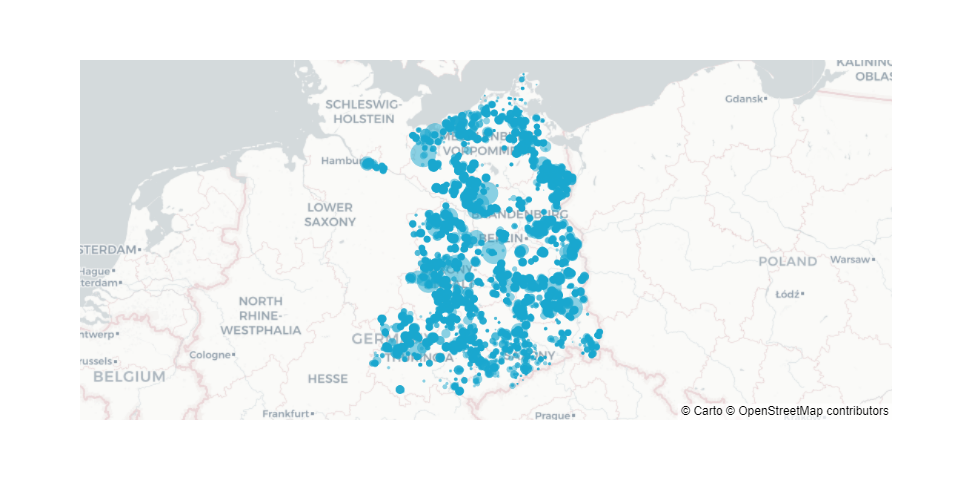

In [70]:
plot_facilities(onshore_df, color=color_dict["Wind Onshore"])

##### Cluster facilities

In [53]:
# Cluster
k = 100

if LOAD_FROM_FILE:
    onshore_df = pd.read_parquet(f"{fpath}/MaStR_data/wind_onshore_MaStR_clustered_{k}_{load_version}.parquet")
    onshore_cluster_centers = pd.read_parquet(f"{fpath}/MaStR_data/wind_onshore_clusters_{k}_{load_version}.parquet")
else:
    onshore_df, onshore_cluster_centers = cluster_facilities(onshore_df, k=k)
    onshore_df.to_parquet(f"{fpath}/MaStR_data/wind_onshore_MaStR_clustered_{k}_{dt.now().strftime('%Y%m%d')}.parquet")
    onshore_cluster_centers.to_parquet(f"{fpath}/MaStR_data/wind_onshore_clusters_{k}_{dt.now().strftime('%Y%m%d')}.parquet")

##### Plot clustered facilities

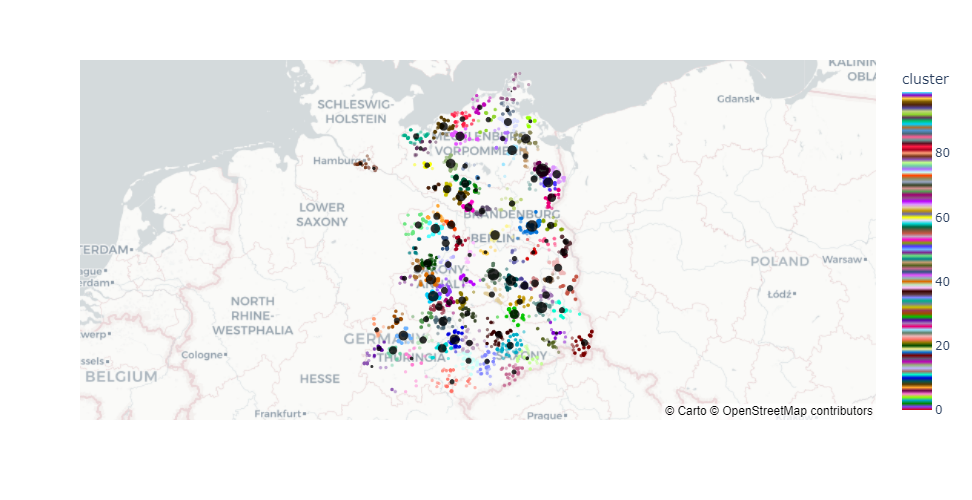

In [24]:
plot_facilities(onshore_df, clustered=True, cluster_centers=onshore_cluster_centers)

##### Get weather data for cluster centroids

In [54]:
LOAD_FROM_FILE = 0
if LOAD_FROM_FILE:
    onshore_weather_df = pd.read_parquet(f"{save_path}/weather/wind_onshore/{k}_clusters/weather_data_weighted_avg.parquet")
else:
    onshore_weather_df = get_weather_data(cluster_df=onshore_cluster_centers, 
                                          save_path=save_path, 
                                          energy_type="wind_onshore", 
                                          start=start.strftime("%Y-%m-%d"),
                                          end=(end-timedelta(days=1)).strftime("%Y-%m-%d"),
                                          timezone=timezone)

Retrieving weather data...
100/100
Done!


##### Aggregate data

In [55]:
# Get aggregate df
aggregate_onshore_df = aggregate_data(onshore_df, onshore_weather_df, generation_df[["Wind Onshore"]])

# Save df
aggregate_onshore_df.to_parquet(f"{save_path}/wind_onshore_data_final_{k}_clusters_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Wind - offshore

In [56]:
LOAD_FROM_FILE = 1
load_version = "20230704"

##### Get MaStR data

In [57]:
if LOAD_FROM_FILE:
    offshore_df = pd.read_parquet(f"{fpath}/MaStR_data/wind_offshore_MaStR_{load_version}.parquet")
else:
    offshore_df = get_MaStR("wind", fpath, "offshore")

##### Plot facilities

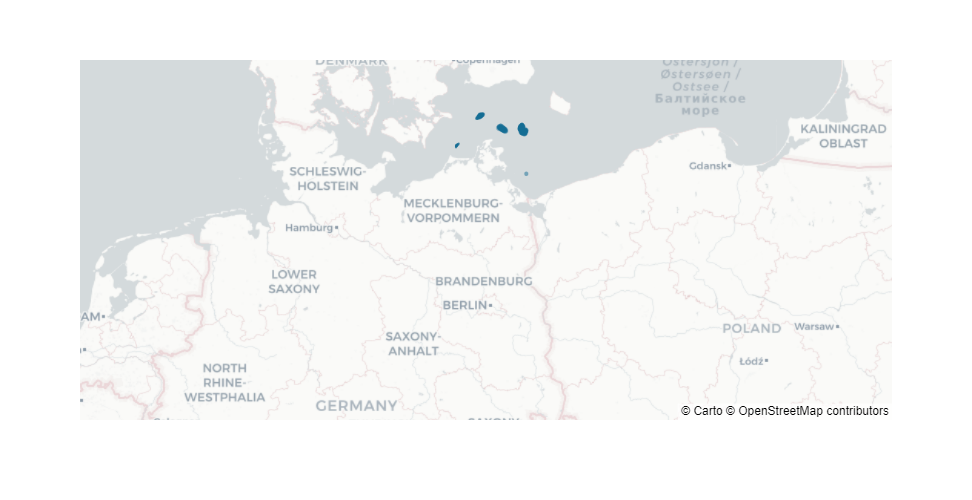

In [29]:
plot_facilities(offshore_df, color=color_dict["Wind Offshore"], size_max=5)

##### Cluster facilities

In [58]:
# Cluster
k = 6

if LOAD_FROM_FILE:
    offshore_df = pd.read_parquet(f"{fpath}/MaStR_data/wind_offshore_MaStR_clustered_{k}_{load_version}.parquet")
    offshore_cluster_centers = pd.read_parquet(f"{fpath}/MaStR_data/wind_offshore_clusters_{k}_{load_version}.parquet")
else:
    offshore_df, offshore_cluster_centers = cluster_facilities(offshore_df, k=k)
    offshore_df.to_parquet(f"{fpath}/MaStR_data/wind_offshore_MaStR_clustered_{k}_{dt.now().strftime('%Y%m%d')}.parquet")
    offshore_cluster_centers.to_parquet(f"{fpath}/MaStR_data/wind_offshore_clusters_{k}_{dt.now().strftime('%Y%m%d')}.parquet")

##### Plot clustered facilities

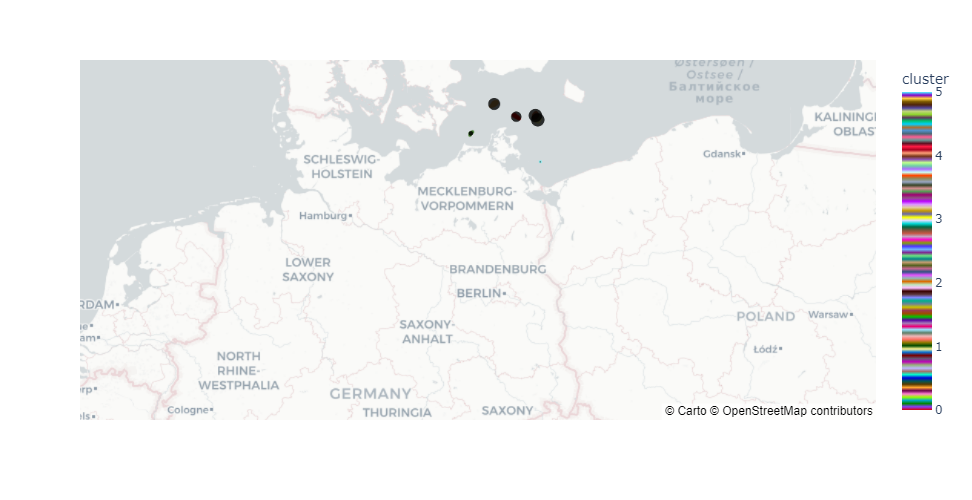

In [31]:
plot_facilities(offshore_df, clustered=True, cluster_centers=offshore_cluster_centers)

##### Get weather data for cluster centroids

In [59]:
LOAD_FROM_FILE = 0
if LOAD_FROM_FILE:
    offshore_weather_df = pd.read_parquet(f"{save_path}/weather/wind_offshore/{k}_clusters/weather_data_weighted_avg.parquet")
else:
    offshore_weather_df = get_weather_data(cluster_df=offshore_cluster_centers, 
                                          save_path=save_path, 
                                          energy_type="wind_offshore", 
                                          start=start.strftime("%Y-%m-%d"),
                                          end=(end-timedelta(days=1)).strftime("%Y-%m-%d"),
                                          timezone=timezone)

Retrieving weather data...
6/6
Done!


##### Aggregate data

In [61]:
# Get aggregate df
aggregate_offshore_df = aggregate_data(offshore_df, offshore_weather_df, generation_df[["Wind Offshore"]])

# Save df
aggregate_offshore_df.to_parquet(f"{save_path}/wind_offshore_data_final_{k}_clusters_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Other renewables
Other renewables includes: 
- Biomass (largest part)
- Water (Hydro Run-of-river and poundage)
- Other renewable (water storage?)

These are not dependent on weather data.
Their location doesn't matter (for now), so no need to check the MaStR

Prediction based on datetime features only 

In [62]:
other_renewables_df = pd.DataFrame(index=generation_df.index)
other_renewables_df["generated_electricity"] = generation_df["Other renewables"]

# Save df
other_renewables_df.to_parquet(f"{save_path}/other_renewables_data_final_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Consumption

Prediction is based solely on timedate features.

Weather data (temperature!) could also be helpful but would need to use some average weather again. Maybe in the future..

In [63]:
final_consumption_df = pd.DataFrame(index=consumption_df.index)
final_consumption_df["total_consumption"] = consumption_df[["Gesamtnetzlast"]]

# Save df
final_consumption_df.to_parquet(f"{save_path}/consumption_data_final_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Brown coal
Electricity generation from brown coal combustion is not directly dependent on the weather but indirectly because it is (to a degree) regulated up or down based on the availablity of renewable energy.

Prediction can therefore be based on renewable generation and consumption.
Possibly also based on other fossil energies but this would become circular in the prediction step.

In [64]:
concat_list = [generation_df[["Solar", "Wind Onshore", "Wind Offshore"]],final_consumption_df["total_consumption"]]
brown_coal_df = pd.concat(concat_list, axis=1)
brown_coal_df["generated_electricity"] = generation_df["Fossil Brown coal/Lignite"]

# Save df
brown_coal_df.to_parquet(f"{save_path}/brown_coal_data_final_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Hard coal
See info for brown coal above.

In [65]:
concat_list = [generation_df[["Solar", "Wind Onshore", "Wind Offshore"]],final_consumption_df["total_consumption"]]
hard_coal_df = pd.concat(concat_list, axis=1)
hard_coal_df["generated_electricity"] = generation_df["Fossil Hard coal"]

# Save df
hard_coal_df.to_parquet(f"{save_path}/hard_coal_data_final_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Gas
See info for brown coal above.

In [66]:
concat_list = [generation_df[["Solar", "Wind Onshore", "Wind Offshore"]],final_consumption_df["total_consumption"]]
gas_df = pd.concat(concat_list, axis=1)
gas_df["generated_electricity"] = generation_df["Fossil Gas"]

# Save df
gas_df.to_parquet(f"{save_path}/gas_data_final_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Other fossils

Other fossils includes:
- Waste
- Fossil Oil
- Other (?)

For prediction, see info for brown coal above.

In [67]:
concat_list = [generation_df[["Solar", "Wind Onshore", "Wind Offshore"]],final_consumption_df["total_consumption"]]
other_fossils_df = pd.concat(concat_list, axis=1)
other_fossils_df["generated_electricity"] = generation_df["Other fossils"]

# Save df
other_fossils_df.to_parquet(f"{save_path}/other_fossils_data_final_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Hydro-pumped storage

See info for brown coal above.

In [68]:
concat_list = [generation_df[["Solar", "Wind Onshore", "Wind Offshore"]],final_consumption_df["total_consumption"]]
hps_df = pd.concat(concat_list, axis=1)
hps_df["generated_electricity"] = generation_df["Hydro Pumped Storage"]

# Save df
hps_df.to_parquet(f"{save_path}/hydro_pumped_storage_data_final_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")

## Price
The electricity price is identical throughout Germany and influenced by fluctuations in generation and consumption in all 4 TSOs (along with other factors such as oil prices etc.). Therefore, the accuracy of price predictions based on energy availability in the 50Hertz grid alone will be limited.

Prediction based on generation of all types + consumption.

In [69]:
start_date = price_df.index.min()
concat_list = [generation_df.loc[generation_df.index>=start_date], 
               final_consumption_df.loc[consumption_df.index>=start_date, "total_consumption"], 
               price_df]
aggregate_price_df = pd.concat(concat_list, axis=1)

# Save df
aggregate_price_df.to_parquet(f"{save_path}/price_data_final_{start.strftime('%Y%m%d')}-{end.strftime('%Y%m%d')}.parquet")